# Survue Object Detection - Final Project

**Course:** CS5330 - Computer Vision 
**Team:** Lawry, Shashu, Reena 
**Date:** 3rd December 2025

---

## Project Overview

This project develops an object detection system for **Survue**, a startup building smart bike lights that detect vehicle proximity. The goal is to train a lightweight, accurate, and fast model to detect:
- **Humans** (pedestrians, cyclists)
- **Traffic Signs**
- **Vehicles** (cars, trucks)

We compare **YOLOv5** and **YOLOv8** architectures to find the best balance of speed, accuracy, and model size for deployment on bike-mounted hardware.

---

# Section 1: Data Exploration & Analysis

In this section, we explore the Survue dataset:
- **500 images** (1920 × 1080 resolution)
- **9,787 annotations** across 3 classes
- Data split: 393 training / 107 validation images

### Key Analysis:
1. Bounding box size distributions
2. Class distribution (imbalanced?)
3. Sample annotated images

In [1]:
# Step 1: Explore the data folder structure
import os
import json

# Path to the data
data_path = "/courses/CS5330.202610/data/FinalProject"

# List everything in the folder
print("Contents of FinalProject folder:")
for item in os.listdir(data_path):
    full_path = os.path.join(data_path, item)
    if os.path.isdir(full_path):
        print(f"  📁 {item}/ ({len(os.listdir(full_path))} items)")
    else:
        print(f"  📄 {item}")

Contents of FinalProject folder:
  📁 annotations/ (3 items)
  📁 images/ (500 items)


In [2]:
# Step 2: Look at the annotation files
import json

annotations_path = "/courses/CS5330.202610/data/FinalProject/annotations"

# List annotation files
print("Annotation files:")
for f in os.listdir(annotations_path):
    print(f"  - {f}")

# Load and explore instances.json
with open(os.path.join(annotations_path, "instances.json"), "r") as f:
    data = json.load(f)

# What keys are in the file?
print("\nKeys in instances.json:")
print(data.keys())

Annotation files:
  - instances.json
  - instances_train.json
  - instances_val.json

Keys in instances.json:
dict_keys(['info', 'categories', 'images', 'annotations'])


In [3]:
# Step 3: Explore categories and data structure

# What categories/classes are there?
print("Categories (objects to detect):")
for cat in data['categories']:
    print(f"  ID {cat['id']}: {cat['name']}")

print(f"\nTotal categories: {len(data['categories'])}")
print(f"Total images: {len(data['images'])}")
print(f"Total annotations: {len(data['annotations'])}")

# Look at one sample image entry
print("\n--- Sample image entry ---")
print(data['images'][0])

# Look at one sample annotation entry
print("\n--- Sample annotation entry ---")
print(data['annotations'][0])

Categories (objects to detect):
  ID 1: human
  ID 2: trafficsign
  ID 3: vehicle

Total categories: 3
Total images: 500
Total annotations: 9787

--- Sample image entry ---
{'id': 0, 'license': None, 'width': 1920, 'height': 1080, 'file_name': 'ti_lindau_V106_2015sept_100_VIRB_VIRB0031_10m_10m_I07710.jpg', 'split_name': 'train'}

--- Sample annotation entry ---
{'bbox': [609.06, 545.66, 15.85, 18.11], 'segmentation': [616.98, 545.66, 612.45, 547.92, 609.06, 553.58, 609.06, 558.11, 612.45, 563.77, 619.25, 563.77, 623.77, 561.51, 624.91, 555.85, 624.91, 551.32, 621.51, 546.79], 'area': 287.0435, 'iscrowd': 0, 'image_id': 0, 'category_id': 2, 'id': 0}


In [4]:
# Step 4: Check train/val split

# Load train and val annotation files
with open(os.path.join(annotations_path, "instances_train.json"), "r") as f:
    train_data = json.load(f)

with open(os.path.join(annotations_path, "instances_val.json"), "r") as f:
    val_data = json.load(f)

print(f"Training images: {len(train_data['images'])}")
print(f"Training annotations: {len(train_data['annotations'])}")

print(f"\nValidation images: {len(val_data['images'])}")
print(f"Validation annotations: {len(val_data['annotations'])}")

Training images: 393
Training annotations: 8092

Validation images: 107
Validation annotations: 1695


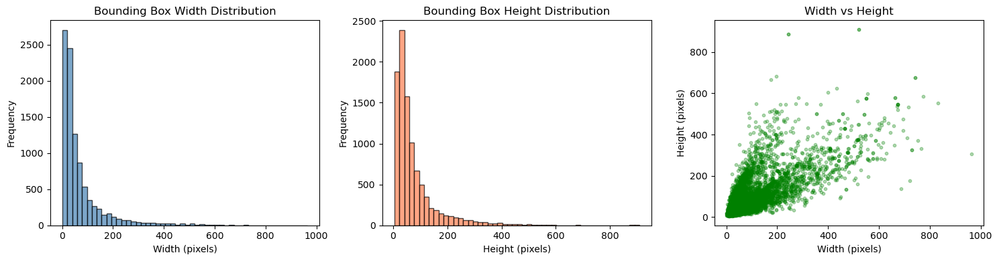

Total annotations: 9787
Width - Mean: 72.1, Median: 37.4, Max: 964.5
Height - Mean: 76.3, Median: 47.5, Max: 908.4


In [34]:
import json
import matplotlib.pyplot as plt
import numpy as np

# Load annotations
data_path = "/courses/CS5330.202610/data/FinalProject"
with open(f"{data_path}/annotations/instances.json", "r") as f:
    data = json.load(f)

# Extract bbox dimensions
widths = []
heights = []
for ann in data['annotations']:
    w = ann['bbox'][2]
    h = ann['bbox'][3]
    widths.append(w)
    heights.append(h)

# Create figure with 3 subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Width histogram
axes[0].hist(widths, bins=50, color='steelblue', edgecolor='black', alpha=0.7)
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Bounding Box Width Distribution')

# Height histogram
axes[1].hist(heights, bins=50, color='coral', edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Height (pixels)')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Bounding Box Height Distribution')

# Scatter plot
axes[2].scatter(widths, heights, alpha=0.3, s=10, c='green')
axes[2].set_xlabel('Width (pixels)')
axes[2].set_ylabel('Height (pixels)')
axes[2].set_title('Width vs Height')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/eda_bbox_analysis.png"), dpi=150, bbox_inches='tight')
plt.show()

print(f"Total annotations: {len(widths)}")
print(f"Width - Mean: {np.mean(widths):.1f}, Median: {np.median(widths):.1f}, Max: {np.max(widths):.1f}")
print(f"Height - Mean: {np.mean(heights):.1f}, Median: {np.median(heights):.1f}, Max: {np.max(heights):.1f}")

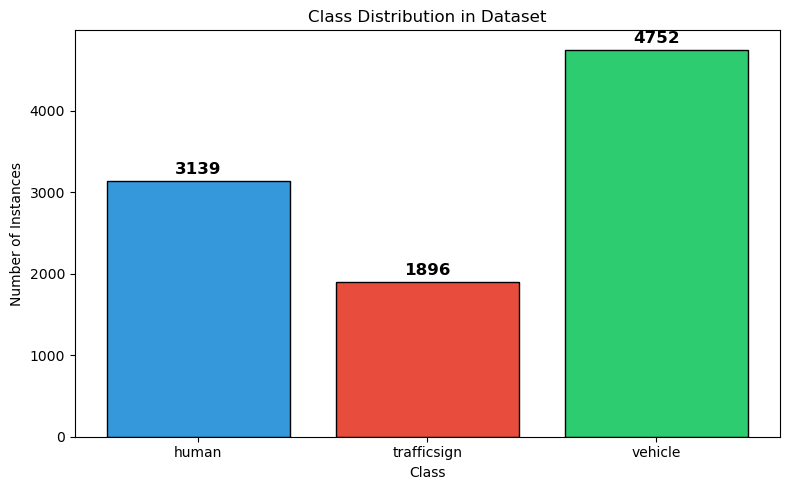

Class counts: {'human': 3139, 'trafficsign': 1896, 'vehicle': 4752}


In [35]:
# Count objects per class
class_names = {cat['id']: cat['name'] for cat in data['categories']}
class_counts = {name: 0 for name in class_names.values()}

for ann in data['annotations']:
    class_name = class_names[ann['category_id']]
    class_counts[class_name] += 1

# Bar chart
plt.figure(figsize=(8, 5))
bars = plt.bar(class_counts.keys(), class_counts.values(), color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black')
plt.xlabel('Class')
plt.ylabel('Number of Instances')
plt.title('Class Distribution in Dataset')

# Add count labels on bars
for bar, count in zip(bars, class_counts.values()):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, str(count), 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/class_distribution.png"), dpi=150, bbox_inches='tight')
plt.show()

print("Class counts:", class_counts)

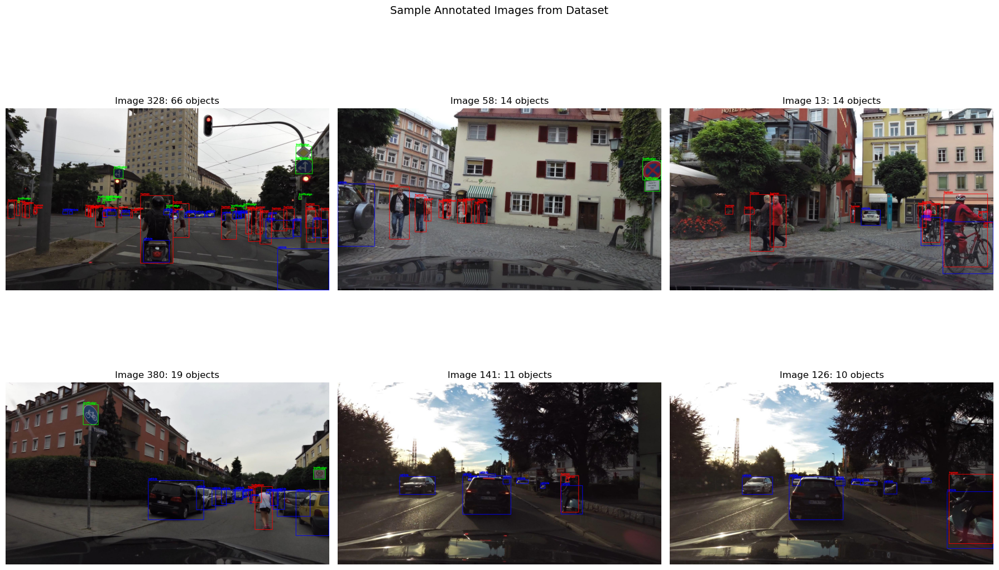

In [36]:
import cv2
import random
from PIL import Image

# Group annotations by image
annotations_by_image = {}
for ann in data['annotations']:
    img_id = ann['image_id']
    if img_id not in annotations_by_image:
        annotations_by_image[img_id] = []
    annotations_by_image[img_id].append(ann)

# Image info lookup
images_info = {img['id']: img for img in data['images']}

# Colors for each class (BGR for OpenCV)
colors = {1: (255, 0, 0), 2: (0, 255, 0), 3: (0, 0, 255)}  # human: blue, trafficsign: green, vehicle: red
class_names = {1: 'human', 2: 'trafficsign', 3: 'vehicle'}

# Select 6 random images
random.seed(42)
sample_ids = random.sample(list(annotations_by_image.keys()), 6)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for ax, img_id in zip(axes.flat, sample_ids):
    img_info = images_info[img_id]
    img_path = f"{data_path}/images/{img_info['file_name']}"
    
    # Read image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw bounding boxes
    for ann in annotations_by_image[img_id]:
        x, y, w, h = [int(v) for v in ann['bbox']]
        cat_id = ann['category_id']
        color = colors[cat_id]
        
        cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
        cv2.putText(img, class_names[cat_id], (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    ax.imshow(img)
    ax.set_title(f"Image {img_id}: {len(annotations_by_image[img_id])} objects")
    ax.axis('off')

plt.suptitle('Sample Annotated Images from Dataset', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/sample_annotated_images.png"), dpi=150, bbox_inches='tight')
plt.show()

---

# Section 2: Model Architecture & Training

## Models Trained:
| Model | Parameters | Size | Description |
|-------|------------|------|-------------|
| YOLOv5s | 7.0M | 14.4 MB | Small, fast |
| YOLOv5m | 20.9M | 42.1 MB | Medium, balanced |
| YOLOv8s | 11.1M | 22.5 MB | Small, anchor-free |
| YOLOv8m | 25.8M | 52.0 MB | Medium, best accuracy |

## Training Configuration:
- **Image size:** 640 × 640
- **Batch size:** 16
- **Epochs:** 50
- **Optimizer:** SGD

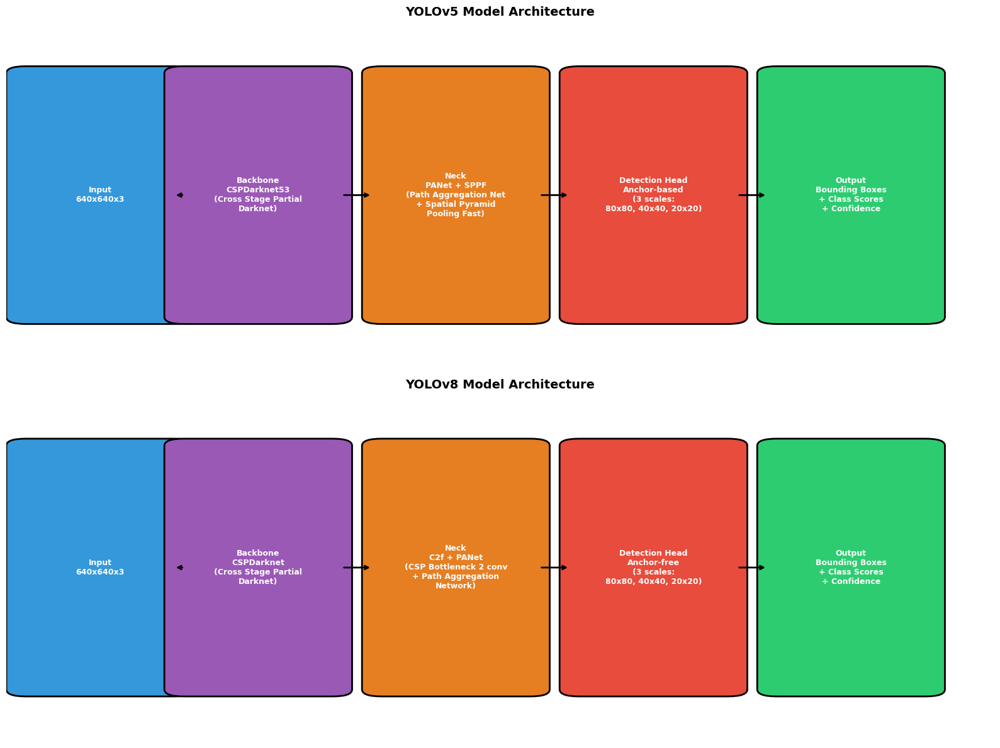

In [40]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# YOLOv5 Architecture
ax = axes[0]
blocks_v5 = [
    {'name': 'Input\n640x640x3', 'x': 0.02, 'color': '#3498db'},
    {'name': 'Backbone\nCSPDarknet53\n(Cross Stage Partial\nDarknet)', 'x': 0.18, 'color': '#9b59b6'},
    {'name': 'Neck\nPANet + SPPF\n(Path Aggregation Net\n+ Spatial Pyramid\nPooling Fast)', 'x': 0.38, 'color': '#e67e22'},
    {'name': 'Detection Head\nAnchor-based\n(3 scales:\n80x80, 40x40, 20x20)', 'x': 0.58, 'color': '#e74c3c'},
    {'name': 'Output\nBounding Boxes\n+ Class Scores\n+ Confidence', 'x': 0.78, 'color': '#2ecc71'},
]

for i, block in enumerate(blocks_v5):
    rect = mpatches.FancyBboxPatch((block['x'], 0.15), 0.15, 0.7, 
                                     boxstyle="round,pad=0.02", 
                                     facecolor=block['color'], 
                                     edgecolor='black', linewidth=2)
    ax.add_patch(rect)
    ax.text(block['x'] + 0.075, 0.5, block['name'], ha='center', va='center', 
            fontsize=9, fontweight='bold', color='white')
    if i < len(blocks_v5) - 1:
        ax.annotate('', xy=(blocks_v5[i+1]['x']-0.01, 0.5), xytext=(block['x']+0.16, 0.5),
                    arrowprops=dict(arrowstyle='->', color='black', lw=2))

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')
ax.set_title('YOLOv5 Model Architecture', fontsize=14, fontweight='bold')

# YOLOv8 Architecture
ax = axes[1]
blocks_v8 = [
    {'name': 'Input\n640x640x3', 'x': 0.02, 'color': '#3498db'},
    {'name': 'Backbone\nCSPDarknet\n(Cross Stage Partial\nDarknet)', 'x': 0.18, 'color': '#9b59b6'},
    {'name': 'Neck\nC2f + PANet\n(CSP Bottleneck 2 conv\n+ Path Aggregation\nNetwork)', 'x': 0.38, 'color': '#e67e22'},
    {'name': 'Detection Head\nAnchor-free\n(3 scales:\n80x80, 40x40, 20x20)', 'x': 0.58, 'color': '#e74c3c'},
    {'name': 'Output\nBounding Boxes\n+ Class Scores\n+ Confidence', 'x': 0.78, 'color': '#2ecc71'},
]

for i, block in enumerate(blocks_v8):
    rect = mpatches.FancyBboxPatch((block['x'], 0.15), 0.15, 0.7, 
                                     boxstyle="round,pad=0.02", 
                                     facecolor=block['color'], 
                                     edgecolor='black', linewidth=2)
    ax.add_patch(rect)
    ax.text(block['x'] + 0.075, 0.5, block['name'], ha='center', va='center', 
            fontsize=9, fontweight='bold', color='white')
    if i < len(blocks_v8) - 1:
        ax.annotate('', xy=(blocks_v8[i+1]['x']-0.01, 0.5), xytext=(block['x']+0.16, 0.5),
                    arrowprops=dict(arrowstyle='->', color='black', lw=2))

ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')
ax.set_title('YOLOv8 Model Architecture', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/model_architecture_full.png"), dpi=150, bbox_inches='tight')
plt.show()

In [5]:
# Step 5: Set up YOLOv5

# First, let's set up a working directory
import os

# Create your project folder (adjust path as needed)
work_dir = os.path.expanduser("~/survue_project")
os.makedirs(work_dir, exist_ok=True)
os.chdir(work_dir)

print(f"Working directory: {os.getcwd()}")

Working directory: /home/crasto.l/survue_project


In [6]:
!cd yolov5 && pip install --user -r requirements.txt

  Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
Using cached numpy-2.2.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 4.2.0 requires fsspec[http]<=2025.9.0,>=2023.1.0, but you have fsspec 2025.10.0 which is incompatible.
numba 0.59.1 requires numpy<1.27,>=1.22, but you have numpy 2.2.6 which is incompatible.
pywavelets 1.5.0 requires numpy<2.0,>=1.22.4, but you have numpy 2.2.6 which is incompatible.
transformers 4.42.4 requires numpy<2.0,>=1.17, but you have numpy 2.2.6 which is incompatible.


In [7]:
!pip install --user torch==2.2.0+cu118 torchvision==0.17.0+cu118 --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118


In [8]:
!python -c "import torch; print('CUDA:', torch.cuda.is_available()); print('GPU:', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'N/A')"


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<string>", line 1, in <module>
  File "/home/crasto.l/.local/lib/python3.12/site-packages/torch/__init__.py", line 1471, in <module>
    from .functional import *  # noqa: F403
  File "/home/crasto.l/.local/lib/python3.12/site-packages/torch/functional.py", line 9, in <module>
    import torch.nn.functional as F
  File "/home/crasto.l/.local/lib/python3.12/site-packages/torch/nn/__init__.py", line 1, in <module>
    from .modules import *  # noqa: F403
  File "/home/crasto.l/.local/lib/python3.12/site-packages/torc

In [11]:
import os

# Check model size
model_path = os.path.expanduser("~/survue_project/yolov5/runs/train/survue_gpu2/weights/best.pt")
size_mb = os.path.getsize(model_path) / (1024 * 1024)
print(f"Model size: {size_mb:.2f} MB")

# List some result images
results_dir = os.path.expanduser("~/survue_project/yolov5/runs/detect/survue_results")
result_images = [f for f in os.listdir(results_dir) if f.endswith('.jpg')]
print(f"\nDetection results: {len(result_images)} images")
print("Sample files:", result_images[:5])

Model size: 13.69 MB

Detection results: 107 images
Sample files: ['ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00000.jpg', 'ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00001.jpg', 'ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00025.jpg', 'ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00055.jpg', 'ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00085.jpg']


In [12]:
!pip install --user numpy==1.26.4

  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
datasets 4.2.0 requires fsspec[http]<=2025.9.0,>=2023.1.0, but you have fsspec 2025.10.0 which is incompatible.


Model size: 13.69 MB
Detection results: 107 images


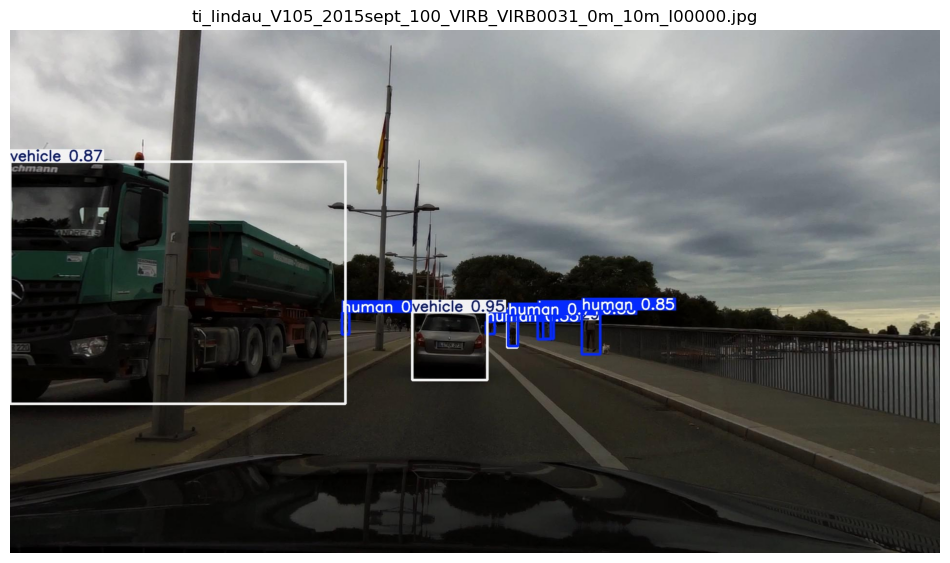

In [13]:
import os
import matplotlib.pyplot as plt
from PIL import Image

results_dir = os.path.expanduser("~/survue_project/yolov5/runs/detect/survue_results")
result_images = [f for f in os.listdir(results_dir) if f.endswith('.jpg')]

# Check model size
model_path = os.path.expanduser("~/survue_project/yolov5/runs/train/survue_gpu2/weights/best.pt")
size_mb = os.path.getsize(model_path) / (1024 * 1024)
print(f"Model size: {size_mb:.2f} MB")
print(f"Detection results: {len(result_images)} images")

# Display first result
img = Image.open(os.path.join(results_dir, result_images[0]))
plt.figure(figsize=(12, 8))
plt.imshow(img)
plt.axis('off')
plt.title(result_images[0])
plt.show()

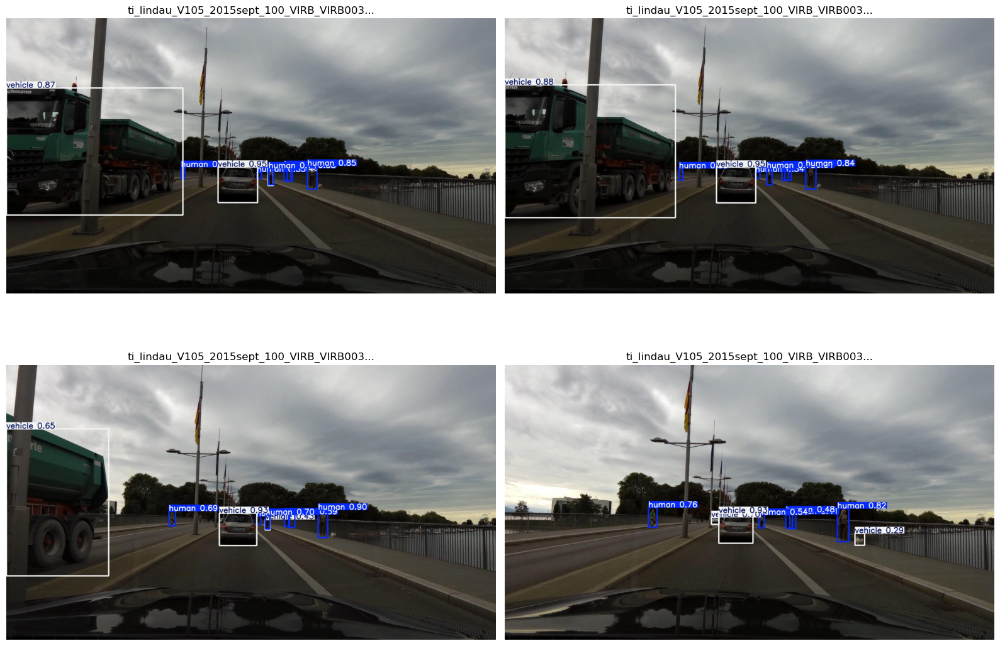


Saved figure to ~/survue_project/detection_results.png


In [14]:
# Display a few more results
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

for i, ax in enumerate(axes.flat):
    if i < len(result_images):
        img = Image.open(os.path.join(results_dir, result_images[i]))
        ax.imshow(img)
        ax.set_title(result_images[i][:40] + "...")
        ax.axis('off')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/detection_results.png"), dpi=150)
plt.show()

print("\nSaved figure to ~/survue_project/detection_results.png")

In [15]:
!cd ~/survue_project/yolov5 && python train.py --img 640 --batch 16 --epochs 50 --data ~/survue_project/survue.yaml --weights yolov5m.pt --device 0 --name survue_yolov5m --cache

train: weights=yolov5m.pt, cfg=, data=/home/crasto.l/survue_project/survue.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=survue_yolov5m, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-450-g781b9d57 Python-3.12.4 torch-2.2.0+cu118 CUDA:0 (Tesla P100-PCIE-12GB, 12194MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, war

In [16]:
import os

# Create YOLOv8 compatible config
yaml_content = f"""# Survue Dataset Config for YOLOv8
path: /home/crasto.l/survue_project/dataset
train: images/train
val: images/val

names:
  0: human
  1: trafficsign
  2: vehicle
"""

yaml_path = os.path.expanduser("~/survue_project/survue_v8.yaml")
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print("Created:", yaml_path)

Created: /home/crasto.l/survue_project/survue_v8.yaml


In [17]:
!cd ~/survue_project && yolo detect train data=survue_v8.yaml model=yolov8s.pt epochs=50 imgsz=640 batch=16 device=0 project=yolov8_runs name=survue_yolov8s

Ultralytics 8.3.234 🚀 Python-3.12.4 torch-2.2.0+cu118 CUDA:0 (Tesla P100-PCIE-12GB, 12194MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=survue_v8.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=survue_yolov8s2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

In [18]:
!cd ~/survue_project && yolo detect train data=survue_v8.yaml model=yolov8m.pt epochs=50 imgsz=640 batch=16 device=0 project=yolov8_runs name=survue_yolov8m

Ultralytics 8.3.234 🚀 Python-3.12.4 torch-2.2.0+cu118 CUDA:0 (Tesla P100-PCIE-12GB, 12194MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=survue_v8.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=survue_yolov8m2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

---

# Section 3: Results & Evaluation

## Final Model Comparison

| Model | mAP@50 | mAP@50-95 | Inference | Size |
|-------|--------|-----------|-----------|------|
| YOLOv5m | 62.5% | 36.6% | ~15 ms | 42.1 MB |
| YOLOv8m | **63.2%** | **39.9%** | 7.0 ms | 52.0 MB |

## Key Findings:
1. **YOLOv8m** achieves the best mAP@50-95 (39.9%)
2. **Vehicle** class has highest detection accuracy (~68%)
3. **Traffic signs** are hardest to detect (~54%) due to small size
4. Both models are suitable for real-time detection (<10ms inference)

## Recommendation for Survue:
**YOLOv8m** offers the best accuracy with fast inference (7ms), making it ideal for real-time bike safety applications.

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# YOLOv5m results folder
yolov5_dir = os.path.expanduser("~/survue_project/yolov5/runs/train/survue_yolov5m")

# YOLOv8m results folder
yolov8_dir = os.path.expanduser("~/survue_project/yolov8_runs/survue_yolov8m")

# List available plots
print("YOLOv5m plots:")
for f in os.listdir(yolov5_dir):
    if f.endswith('.png'):
        print(f"  {f}")

print("\nYOLOv8m plots:")
for f in os.listdir(yolov8_dir):
    if f.endswith('.png'):
        print(f"  {f}")

YOLOv5m plots:
  F1_curve.png
  PR_curve.png
  P_curve.png
  R_curve.png
  confusion_matrix.png
  results.png

YOLOv8m plots:
  BoxF1_curve.png
  BoxPR_curve.png
  BoxP_curve.png
  BoxR_curve.png
  confusion_matrix.png
  confusion_matrix_normalized.png
  results.png


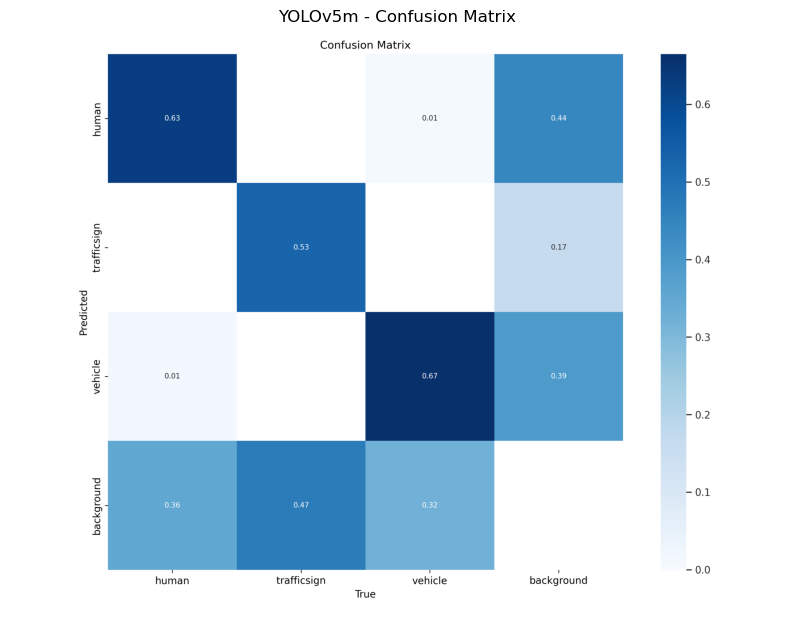

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

yolov5_dir = os.path.expanduser("~/survue_project/yolov5/runs/train/survue_yolov5m")

# YOLOv5m - Confusion Matrix
img = Image.open(os.path.join(yolov5_dir, 'confusion_matrix.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv5m - Confusion Matrix')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_confusion_matrix.png"), dpi=150, bbox_inches='tight')
plt.show()

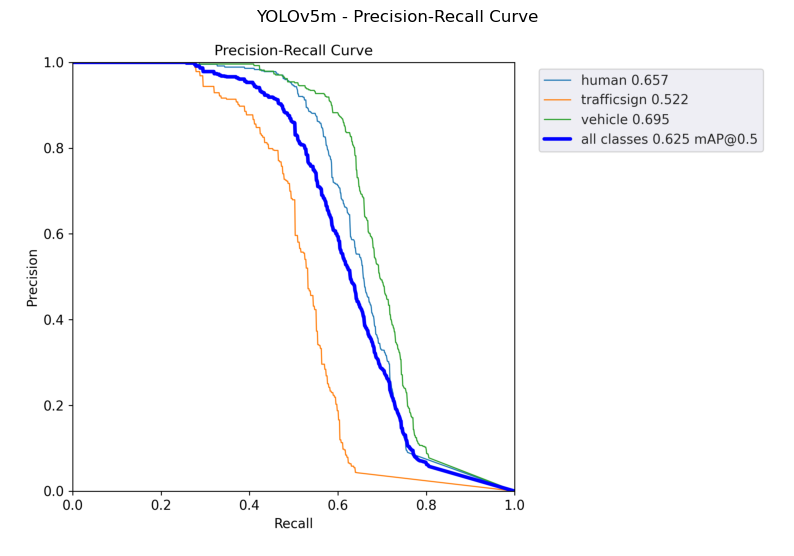

In [ ]:
# YOLOv5m - PR Curve
img = Image.open(os.path.join(yolov5_dir, 'PR_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv5m - Precision-Recall Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_PR_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

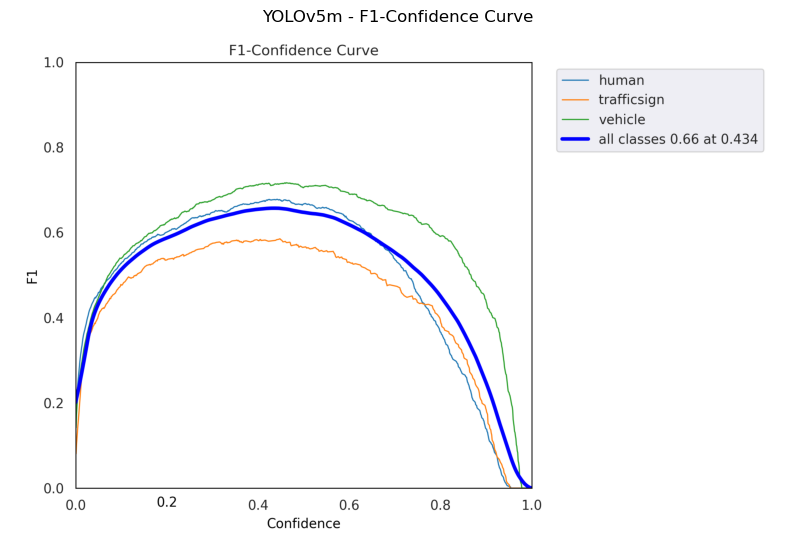

In [ ]:
# YOLOv5m - F1 Curve
img = Image.open(os.path.join(yolov5_dir, 'F1_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv5m - F1-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_F1_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

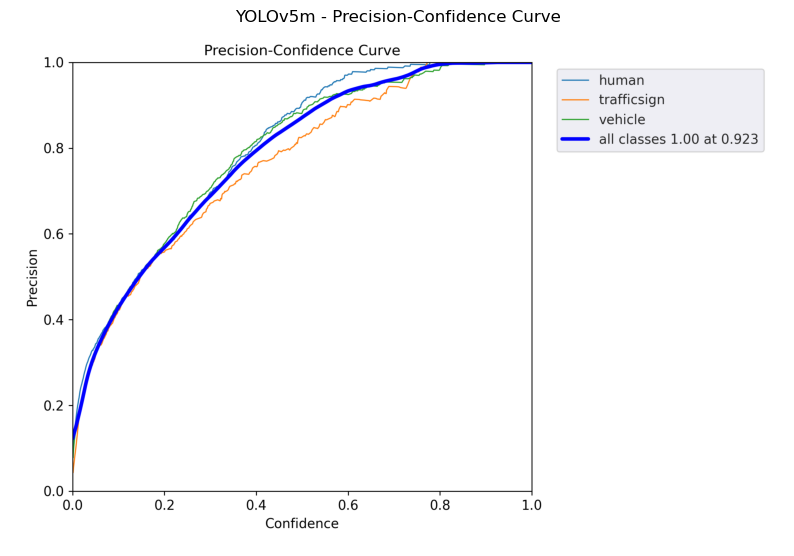

In [ ]:
# YOLOv5m - Precision Curve
img = Image.open(os.path.join(yolov5_dir, 'P_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv5m - Precision-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_P_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

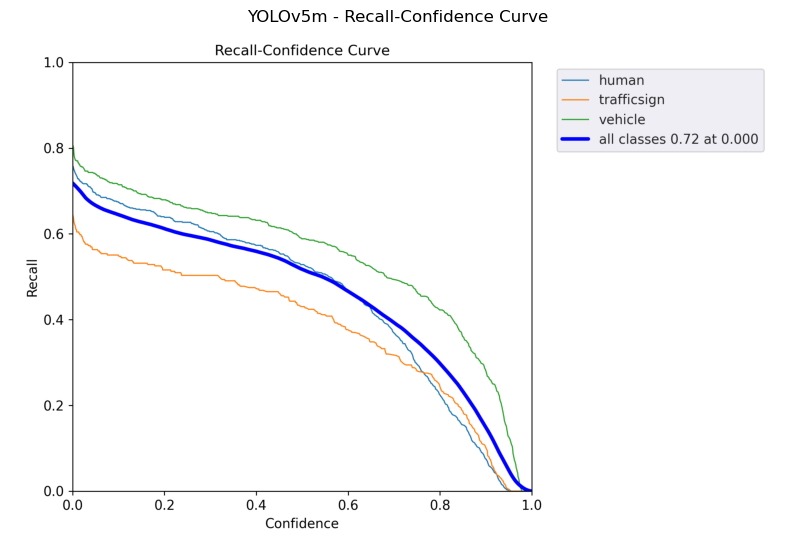

In [ ]:
# YOLOv5m - Recall Curve
img = Image.open(os.path.join(yolov5_dir, 'R_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv5m - Recall-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_R_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

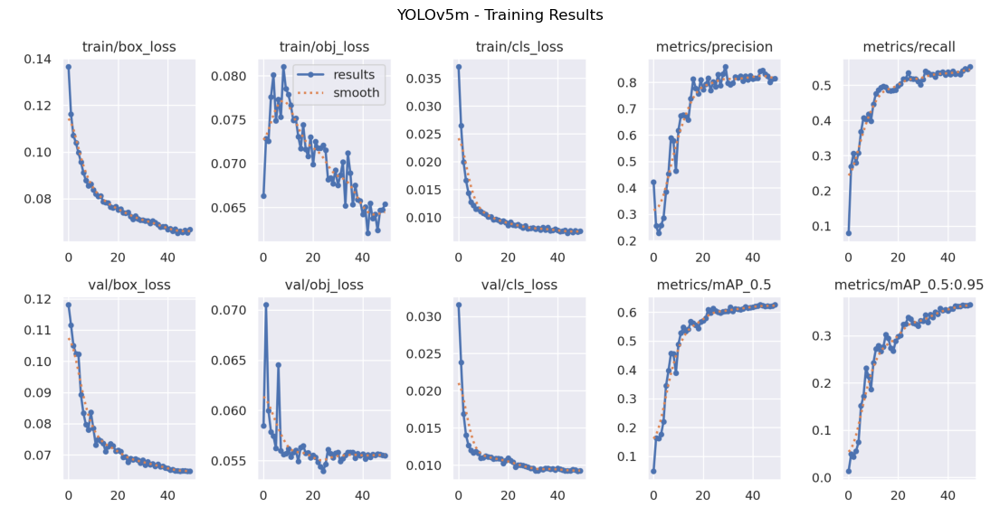

In [ ]:
# YOLOv5m - Training Results
img = Image.open(os.path.join(yolov5_dir, 'results.png'))
plt.figure(figsize=(14, 10))
plt.imshow(img)
plt.title('YOLOv5m - Training Results')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov5m_results.png"), dpi=150, bbox_inches='tight')
plt.show()

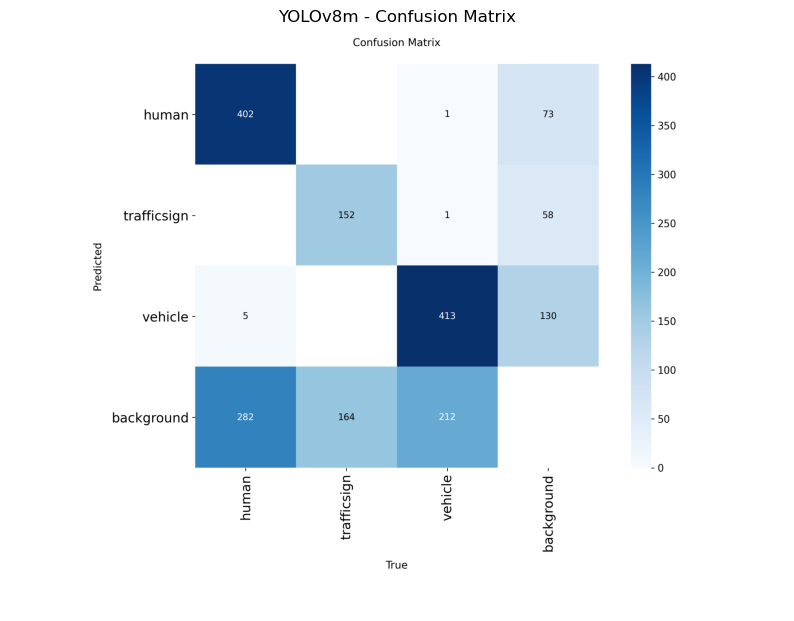

In [ ]:
yolov8_dir = os.path.expanduser("~/survue_project/yolov8_runs/survue_yolov8m")

# YOLOv8m - Confusion Matrix
img = Image.open(os.path.join(yolov8_dir, 'confusion_matrix.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv8m - Confusion Matrix')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_confusion_matrix.png"), dpi=150, bbox_inches='tight')
plt.show()

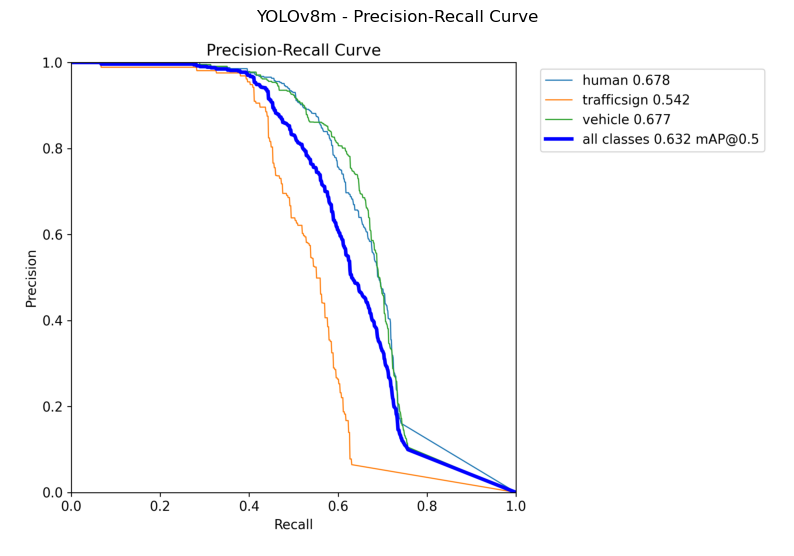

In [ ]:
# YOLOv8m - PR Curve
img = Image.open(os.path.join(yolov8_dir, 'BoxPR_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv8m - Precision-Recall Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_PR_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

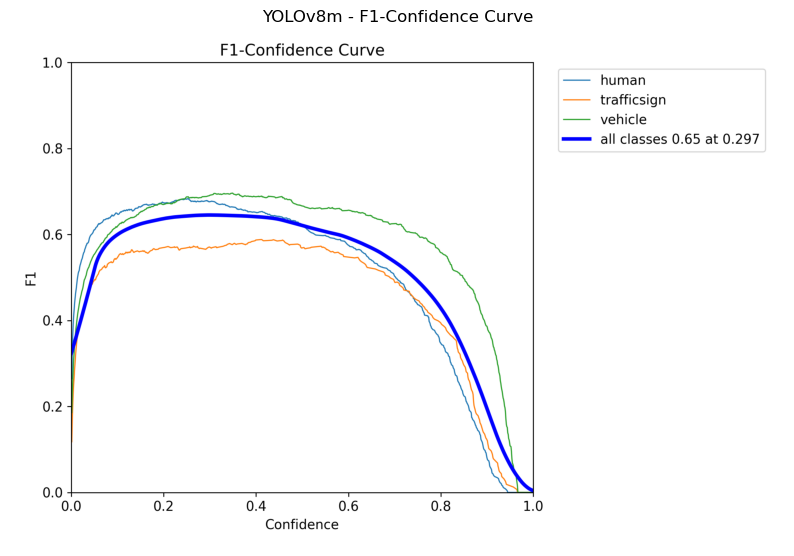

In [ ]:
# YOLOv8m - F1 Curve
img = Image.open(os.path.join(yolov8_dir, 'BoxF1_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv8m - F1-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_F1_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

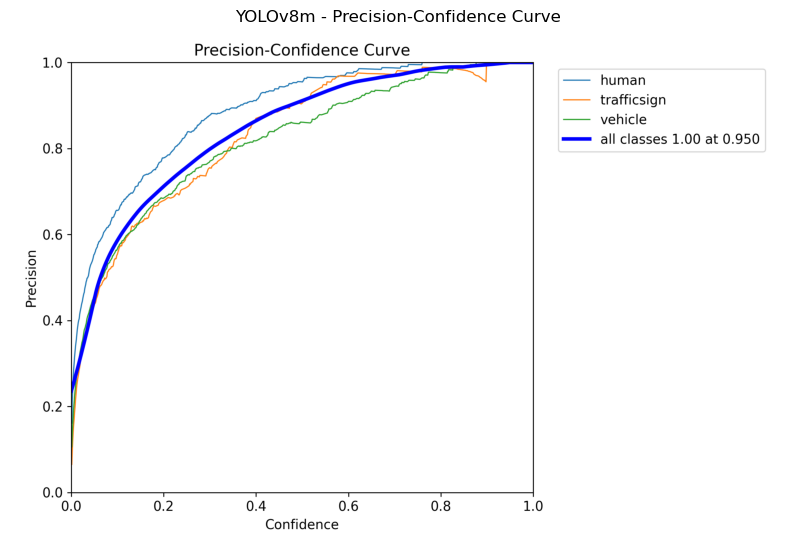

In [ ]:
# YOLOv8m - Precision Curve
img = Image.open(os.path.join(yolov8_dir, 'BoxP_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv8m - Precision-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_P_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

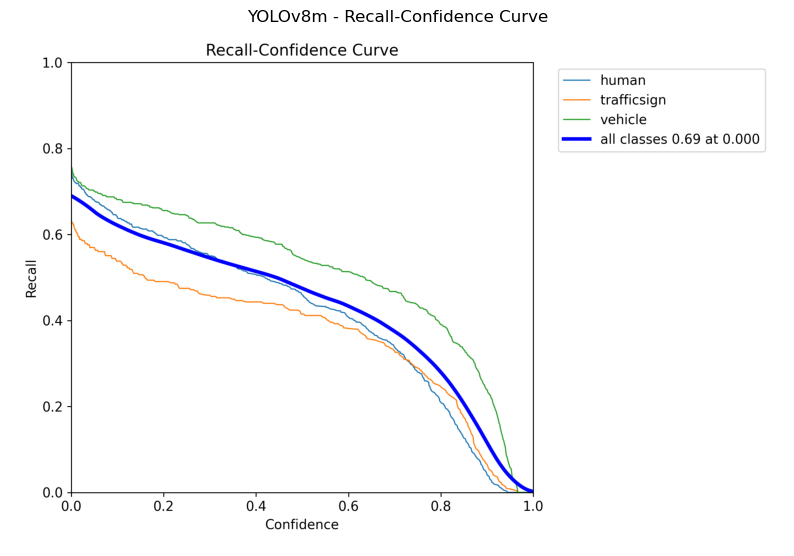

In [ ]:
# YOLOv8m - Recall Curve
img = Image.open(os.path.join(yolov8_dir, 'BoxR_curve.png'))
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.title('YOLOv8m - Recall-Confidence Curve')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_R_curve.png"), dpi=150, bbox_inches='tight')
plt.show()

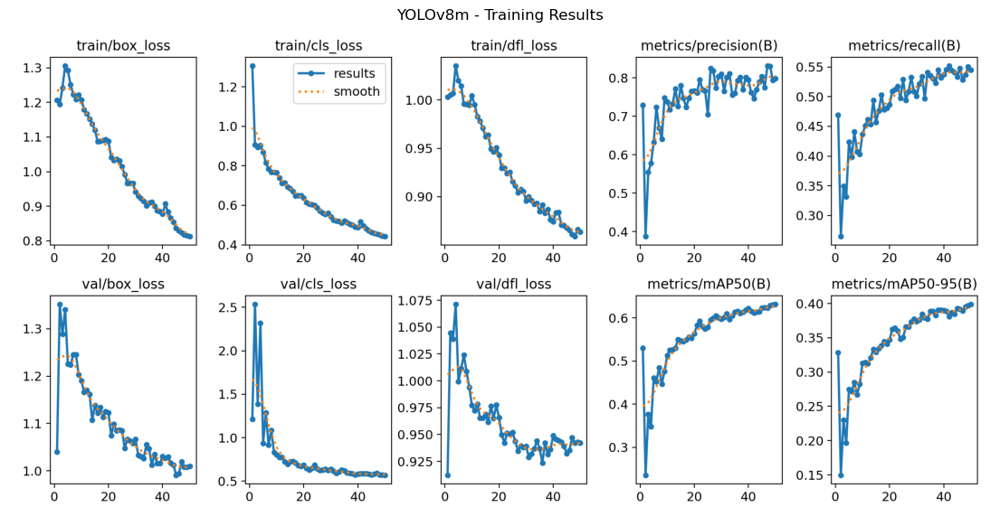

In [ ]:
# YOLOv8m - Training Results
img = Image.open(os.path.join(yolov8_dir, 'results.png'))
plt.figure(figsize=(14, 10))
plt.imshow(img)
plt.title('YOLOv8m - Training Results')
plt.axis('off')
plt.savefig(os.path.expanduser("~/survue_project/yolov8m_results.png"), dpi=150, bbox_inches='tight')
plt.show()

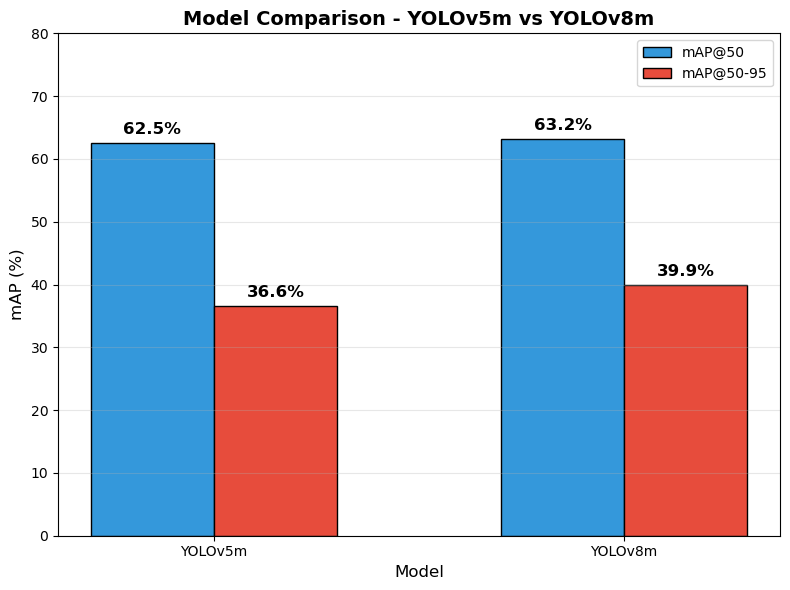

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

models = ['YOLOv5m', 'YOLOv8m']
mAP50 = [62.5, 63.2]
mAP50_95 = [36.6, 39.9]

x = np.arange(len(models))
width = 0.3

fig, ax = plt.subplots(figsize=(8, 6))
bars1 = ax.bar(x - width/2, mAP50, width, label='mAP@50', color='#3498db', edgecolor='black')
bars2 = ax.bar(x + width/2, mAP50_95, width, label='mAP@50-95', color='#e74c3c', edgecolor='black')

ax.set_xlabel('Model', fontsize=12)
ax.set_ylabel('mAP (%)', fontsize=12)
ax.set_title('Model Comparison - YOLOv5m vs YOLOv8m', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()
ax.set_ylim(0, 80)
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{bar.get_height():.1f}%', 
            ha='center', va='bottom', fontsize=12, fontweight='bold')
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{bar.get_height():.1f}%', 
            ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/model_comparison_v5m_v8m.png"), dpi=150, bbox_inches='tight')
plt.show()

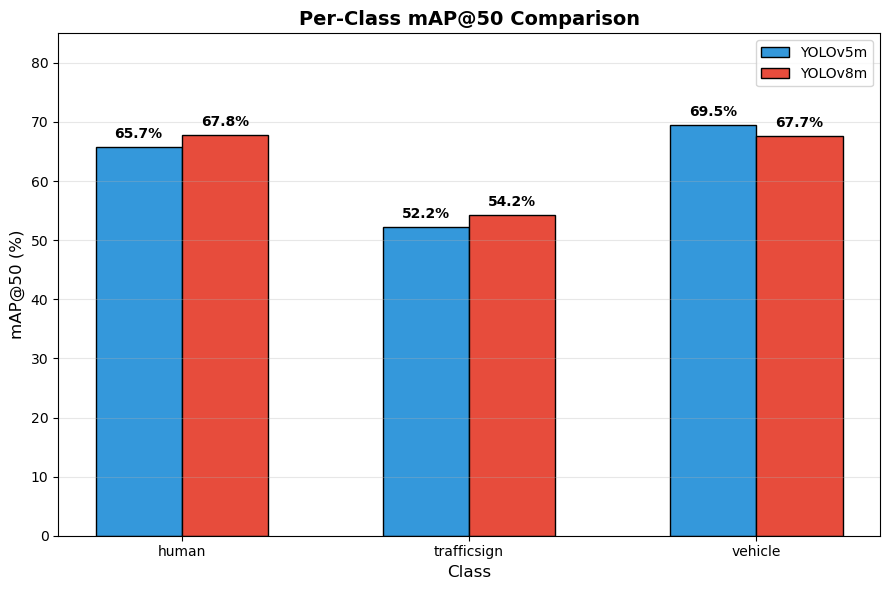

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

classes = ['human', 'trafficsign', 'vehicle']
yolov5m = [65.7, 52.2, 69.5]
yolov8m = [67.8, 54.2, 67.7]

x = np.arange(len(classes))
width = 0.3

fig, ax = plt.subplots(figsize=(9, 6))
bars1 = ax.bar(x - width/2, yolov5m, width, label='YOLOv5m', color='#3498db', edgecolor='black')
bars2 = ax.bar(x + width/2, yolov8m, width, label='YOLOv8m', color='#e74c3c', edgecolor='black')

ax.set_xlabel('Class', fontsize=12)
ax.set_ylabel('mAP@50 (%)', fontsize=12)
ax.set_title('Per-Class mAP@50 Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.legend()
ax.set_ylim(0, 85)
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{bar.get_height():.1f}%', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, f'{bar.get_height():.1f}%', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/per_class_comparison_v5m_v8m.png"), dpi=150, bbox_inches='tight')
plt.show()

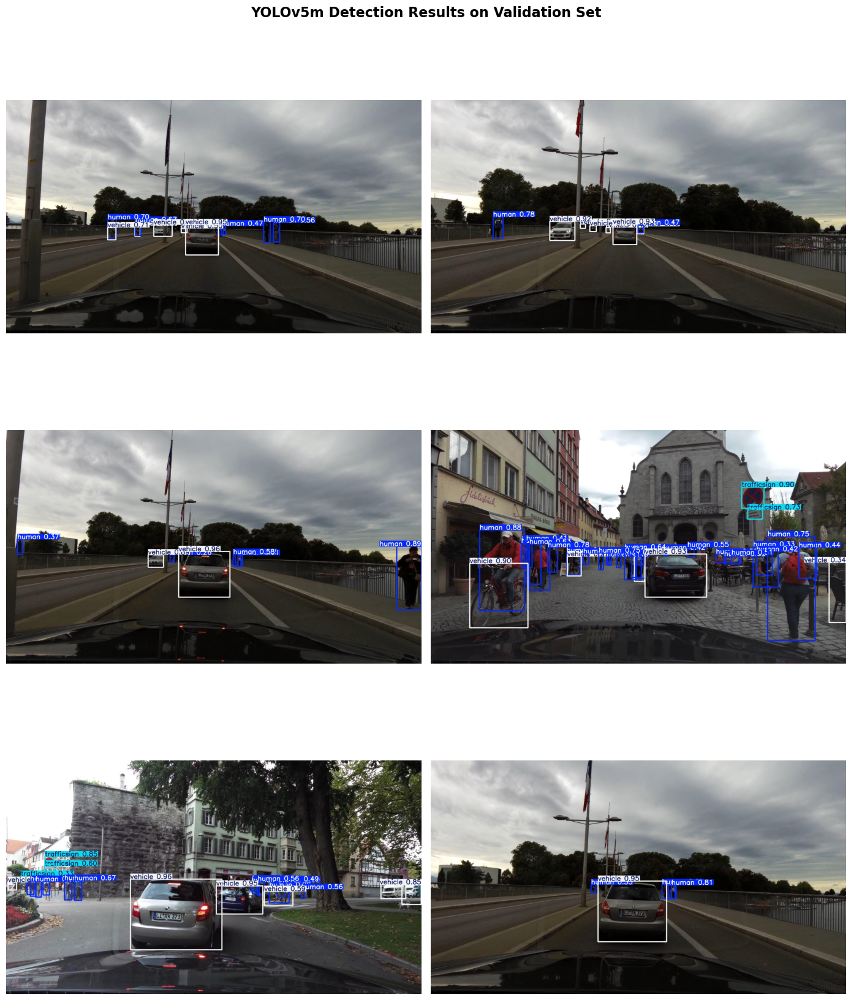

In [ ]:
# YOLOv5m detection results
results_dir_v5 = os.path.expanduser("~/survue_project/yolov5/runs/detect/survue_results")
result_images_v5 = [f for f in os.listdir(results_dir_v5) if f.endswith('.jpg')]

random.seed(123)
selected_v5 = random.sample(result_images_v5, 6)

fig, axes = plt.subplots(3, 2, figsize=(14, 18))

for ax, img_name in zip(axes.flat, selected_v5):
    img = Image.open(os.path.join(results_dir_v5, img_name))
    ax.imshow(img)
    ax.axis('off')

plt.suptitle('YOLOv5m Detection Results on Validation Set', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/qualitative_results_yolov5m.png"), dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
!cd ~/survue_project && yolo detect predict model=yolov8_runs/survue_yolov8m/weights/best.pt source=dataset/images/val conf=0.25 save=True project=yolov8_runs name=yolov8m_results

Ultralytics 8.3.234 🚀 Python-3.12.4 torch-2.2.0+cu118 CUDA:0 (Tesla P100-PCIE-12GB, 12194MiB)
Model summary (fused): 92 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs

image 1/107 /home/crasto.l/survue_project/dataset/images/val/ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00000.jpg: 384x640 6 humans, 1 vehicle, 64.7ms
image 2/107 /home/crasto.l/survue_project/dataset/images/val/ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00001.jpg: 384x640 5 humans, 1 vehicle, 13.7ms
image 3/107 /home/crasto.l/survue_project/dataset/images/val/ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00025.jpg: 384x640 5 humans, 1 trafficsign, 3 vehicles, 13.6ms
image 4/107 /home/crasto.l/survue_project/dataset/images/val/ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00055.jpg: 384x640 5 humans, 3 vehicles, 13.7ms
image 5/107 /home/crasto.l/survue_project/dataset/images/val/ti_lindau_V105_2015sept_100_VIRB_VIRB0031_0m_10m_I00085.jpg: 384x640 6 humans, 3 vehicles, 13.6ms
image 6/107 /ho

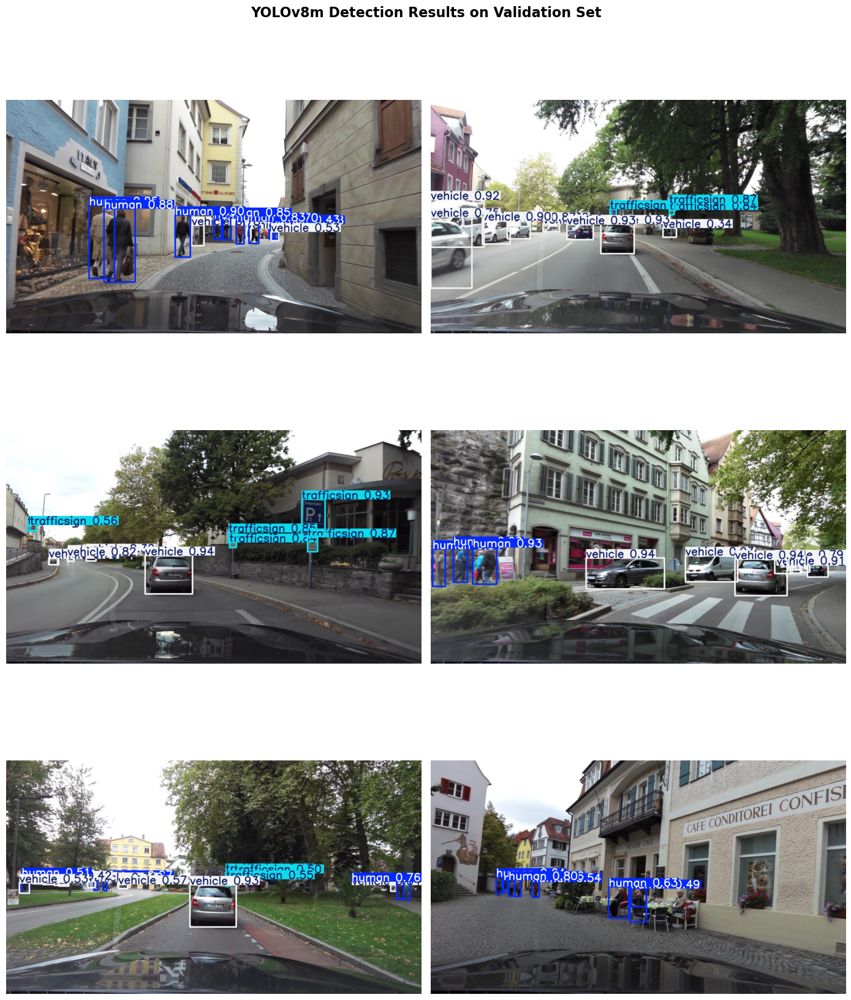

In [ ]:
# YOLOv8m detection results
results_dir_v8 = os.path.expanduser("~/survue_project/yolov8_runs/yolov8m_results")
result_images_v8 = [f for f in os.listdir(results_dir_v8) if f.endswith('.jpg')]

random.seed(456)
selected_v8 = random.sample(result_images_v8, 6)

fig, axes = plt.subplots(3, 2, figsize=(14, 18))

for ax, img_name in zip(axes.flat, selected_v8):
    img = Image.open(os.path.join(results_dir_v8, img_name))
    ax.imshow(img)
    ax.axis('off')

plt.suptitle('YOLOv8m Detection Results on Validation Set', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.expanduser("~/survue_project/qualitative_results_yolov8m.png"), dpi=150, bbox_inches='tight')
plt.show()